In [1]:
#from google.colab import drive
#drive.mount('/gdrive')

In [2]:
#%cd /gdrive/My Drive/AN2DL/ExerciseSession8

In [3]:
#%pip install pandas
#%pip install seaborn
#%pip install matplotlib
#%pip install scikit-learn
#%pip install plotly
#%pip install nbformat

In [4]:
import tensorflow as tf
import numpy as np
import io
import os
import random
import pandas as pd
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score
from sklearn.metrics import confusion_matrix
from PIL import Image
import scipy.io as sio

from plotly.subplots import make_subplots
import plotly.graph_objects as go

tfk = tf.keras
tfkl = tf.keras.layers
print(tf.__version__)

2.10.1


In [5]:
# Random seed for reproducibility
seed = 42

random.seed(seed)
os.environ['PYTHONHASHSEED'] = str(seed)
np.random.seed(seed)
tf.random.set_seed(seed)
tf.compat.v1.set_random_seed(seed)

# Neural Machine Translation (Italian/English)

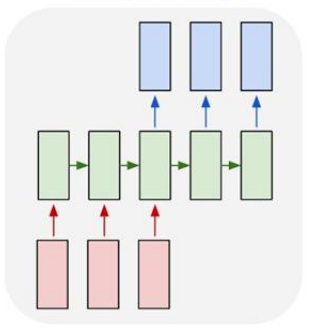

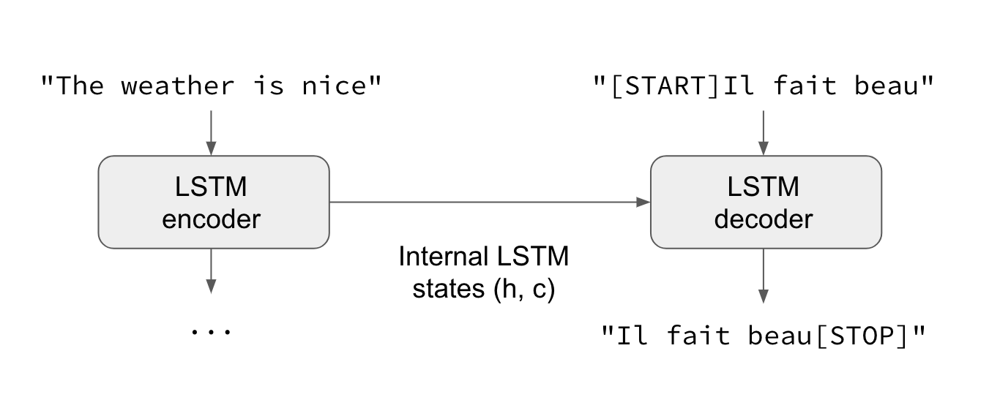

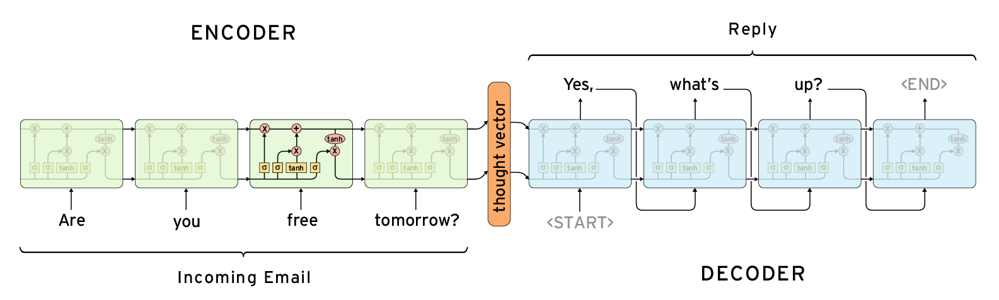

# Load Dataset

Dataset source: http://www.manythings.org/anki/

In [6]:
#!head -100 fra.txt

## Prepare training dataset

In [7]:
# Divide french and english sentences
# ------------------------------------

def read_txt(txt_file):

  fra_sentences = []
  eng_sentences = []
  eng_sentences_train = []

  # Read all the lines in the file
  count = 0
  for line in open(txt_file, encoding='utf-8'):

      # Each line is eng + \t + ita + \t + other stuff
      # Split by '\t' char
      if '\t' not in line:
          continue
      eng_sentence, fra_sentence, _ = line.rstrip().split('\t')

      eng_sentences.append(eng_sentence)
      fra_sentences.append(fra_sentence)
      count += 1

  return eng_sentences, fra_sentences

In [8]:
# Get english-french sentence pairs
eng_sentences, fra_sentences = read_txt('train/fra.txt')

In [9]:
# Number of total english sentences
tot_eng = len(eng_sentences)
print("Number of english sentences:", tot_eng)
# Number of total french sentences
tot_fra = len(fra_sentences)
print("Number of french sentences:", tot_fra)

# Compute number of words per sentence
words_per_eng_sentence = [len(s.split(' ')) for s in eng_sentences]
words_per_fr_sentence = [len(s.split(' ')) for s in fra_sentences]

fig = make_subplots(rows=2, cols=1, subplot_titles=("Words per english sentence", "Words per fr sentence"))

fig.add_trace(
    go.Histogram(x=words_per_eng_sentence),
    row=1, col=1
)
fig.add_trace(
    go.Histogram(x=words_per_fr_sentence),
    row=2, col=1
)
fig.update_layout(height=800, title_text="Words per sentence", showlegend=False)
fig.show()

Number of english sentences: 229803
Number of french sentences: 229803


In [10]:
# Add special words SOS and EOS to identify the start and the end of the translated sentence, respectively
eng_sentences = ['SOS ' + s + ' EOS' for s in eng_sentences]

## Keras Tokenizer



*   Allows to automatically extract words from text
*   Allows to automatically filter chars from text



In [11]:
from tensorflow.keras.preprocessing.text import Tokenizer

# Create the english Tokenizer
eng_tokenizer = Tokenizer(num_words=None,  # Max number of words to consider
                          filters='!"#$%&()*+,-./:;<=>?@[\\]^_`{|}~\t\n',  # filter all punctuation except "'" (simplification)
                          lower=True,  # convert all words to lowercase
                          split=' ')  # Find words by splitting by space ' '
# Fit the tokenizer on english sentences
eng_tokenizer.fit_on_texts(eng_sentences)

# Create the french Tokenizer
fra_tokenizer = Tokenizer(num_words=None,
                          filters='«»!"#$%&()*+,-./:;<=>?@[\\]^_`{|}~\t\n',
                          lower=True,
                          split=' ')
# Fit the tokenizer on italian sentences
fra_tokenizer.fit_on_texts(fra_sentences)

In [12]:
# Print automatically gathered information
print("English word counts dictionary")
eng_word_counts = {k: v for k, v in sorted(eng_tokenizer.word_counts.items(), key=lambda item: item[1], reverse=True)}
print(eng_word_counts)  # reverse sorted by frequency
print()

fig = go.Figure(data=go.Scatter(y=[v for k,v in eng_word_counts.items()], x=[k for k,v in eng_word_counts.items()]))
fig.update_layout(height=300, title_text="English word counts", showlegend=False)
fig.show()

# Dictionary where keys are words and values are automatically assigned integer encodings (already ordered by frequency)
print("English word index dictionary (0 index is reserved for padding)")
print(eng_tokenizer.word_index)
print()

# Print automatically gathered information
print("French word counts dictionary")
fra_word_counts = {k: v for k, v in sorted(fra_tokenizer.word_counts.items(), key=lambda item: item[1], reverse=True)}
print(fra_word_counts)  # reverse sorted by frequency
print()

fig = go.Figure(data=go.Scatter(y=[v for k,v in fra_word_counts.items()], x=[k for k,v in fra_word_counts.items()]))
fig.update_layout(height=300, title_text="French word counts", showlegend=False)
fig.show()

# Dictionary where keys are words and values are automatically assigned integer encodings (already ordered by frequency)
print("French word index dictionary (0 index is reserved for padding)")
print(fra_tokenizer.word_index)
print()

English word counts dictionary
{'sos': 229803, 'eos': 229803, 'i': 62403, 'you': 58426, 'to': 49637, 'the': 45069, 'a': 32311, 'tom': 23068, 'is': 22507, 'that': 20776, 'do': 16154, 'of': 14856, 'it': 14845, 'this': 14640, 'in': 13728, 'me': 13443, "don't": 13392, 'he': 13306, 'have': 13105, 'was': 12059, "i'm": 10914, 'my': 10864, 'for': 10544, 'are': 10342, 'your': 10053, 'what': 9869, 'we': 9798, 'be': 9316, 'want': 8472, 'know': 8220, 'not': 7966, 'on': 7202, 'like': 7134, 'with': 6697, 'she': 6636, 'can': 6379, "you're": 6016, 'think': 5883, 'did': 5820, 'how': 5652, 'at': 5631, 'all': 5504, 'his': 5414, 'go': 5288, "it's": 5079, 'they': 4846, 'and': 4687, 'here': 4552, 'time': 4511, 'about': 4462, "didn't": 4404, 'get': 4252, "can't": 4243, 'him': 4229, 'very': 4165, 'there': 4038, 'were': 3917, 'going': 3844, 'no': 3741, 'as': 3676, 'will': 3628, 'why': 3621, 'up': 3597, 'one': 3596, 'out': 3473, 'had': 3469, 'has': 3451, 'if': 3448, 'just': 3437, 'need': 3307, "i'll": 3286, 'he

English word index dictionary (0 index is reserved for padding)
{'sos': 1, 'eos': 2, 'i': 3, 'you': 4, 'to': 5, 'the': 6, 'a': 7, 'tom': 8, 'is': 9, 'that': 10, 'do': 11, 'of': 12, 'it': 13, 'this': 14, 'in': 15, 'me': 16, "don't": 17, 'he': 18, 'have': 19, 'was': 20, "i'm": 21, 'my': 22, 'for': 23, 'are': 24, 'your': 25, 'what': 26, 'we': 27, 'be': 28, 'want': 29, 'know': 30, 'not': 31, 'on': 32, 'like': 33, 'with': 34, 'she': 35, 'can': 36, "you're": 37, 'think': 38, 'did': 39, 'how': 40, 'at': 41, 'all': 42, 'his': 43, 'go': 44, "it's": 45, 'they': 46, 'and': 47, 'here': 48, 'time': 49, 'about': 50, "didn't": 51, 'get': 52, "can't": 53, 'him': 54, 'very': 55, 'there': 56, 'were': 57, 'going': 58, 'no': 59, 'as': 60, 'will': 61, 'why': 62, 'up': 63, 'one': 64, 'out': 65, 'had': 66, 'has': 67, 'if': 68, 'just': 69, 'need': 70, "i'll": 71, 'her': 72, 'good': 73, 'so': 74, 'mary': 75, "i've": 76, 'would': 77, 'an': 78, "that's": 79, 'help': 80, 'when': 81, 'tell': 82, 'come': 83, 'see':

French word index dictionary (0 index is reserved for padding)
{'je': 1, 'de': 2, 'pas': 3, 'que': 4, 'vous': 5, 'ne': 6, 'à': 7, 'le': 8, 'la': 9, 'tu': 10, 'tom': 11, 'il': 12, 'ce': 13, 'est': 14, 'a': 15, 'un': 16, 'nous': 17, 'les': 18, 'en': 19, 'une': 20, "j'ai": 21, 'suis': 22, 'pour': 23, 'me': 24, 'faire': 25, 'ça': 26, "c'est": 27, 'elle': 28, 'dans': 29, 'plus': 30, 'des': 31, 'tout': 32, 'qui': 33, 'moi': 34, 'te': 35, 'veux': 36, 'fait': 37, 'du': 38, 'mon': 39, 'avec': 40, 'se': 41, 'au': 42, 'si': 43, "n'est": 44, 'et': 45, 'sont': 46, 'y': 47, 'cette': 48, 'être': 49, "qu'il": 50, 'as': 51, 'êtes': 52, 'peux': 53, 'très': 54, 'sais': 55, 'pense': 56, 'cela': 57, 'sur': 58, 'son': 59, 'temps': 60, 'votre': 61, 'dit': 62, 'pourquoi': 63, 'était': 64, 'été': 65, 'ils': 66, 'avez': 67, 'ma': 68, 'es': 69, 'chose': 70, "n'ai": 71, 'ici': 72, 'lui': 73, 'jamais': 74, 'toi': 75, 'comment': 76, 'bien': 77, 'où': 78, 'on': 79, 'ton': 80, 'quelque': 81, 'vraiment': 82, 'beaucoup

In [13]:
# Tokenize sentences assigning each word to the corresponding integer label
# -------------------------------------------------------------------------

# Tokenize english sentences
tokenized_eng_sentences = eng_tokenizer.texts_to_sequences(eng_sentences)

# Tokenize french sentences
tokenized_fra_sentences = fra_tokenizer.texts_to_sequences(fra_sentences)

print("Tokenized english sentences (first 100)")
print({s: t_s for s, t_s in zip(eng_sentences[:100], tokenized_eng_sentences[:100])})
print()
print("Tokenized french sentences (first 100)")
print({s: t_s for s, t_s in zip(fra_sentences[:100], tokenized_fra_sentences[:100])})
print()

Tokenized english sentences (first 100)
{'SOS Go. EOS': [1, 44, 2], 'SOS Hi. EOS': [1, 2589, 2], 'SOS Run! EOS': [1, 418, 2], 'SOS Run. EOS': [1, 418, 2], 'SOS Who? EOS': [1, 85, 2], 'SOS Wow! EOS': [1, 3419, 2], 'SOS Duck! EOS': [1, 4337, 2], 'SOS Fire! EOS': [1, 447, 2], 'SOS Help! EOS': [1, 80, 2], 'SOS Hide. EOS': [1, 1088, 2], 'SOS Jump! EOS': [1, 1321, 2], 'SOS Jump. EOS': [1, 1321, 2], 'SOS Stop! EOS': [1, 185, 2], 'SOS Wait! EOS': [1, 252, 2], 'SOS Wait. EOS': [1, 252, 2], 'SOS Begin. EOS': [1, 965, 2], 'SOS Go on. EOS': [1, 44, 32, 2], 'SOS Hello! EOS': [1, 1620, 2], 'SOS Hello. EOS': [1, 1620, 2], 'SOS I see. EOS': [1, 3, 84, 2], 'SOS I try. EOS': [1, 3, 202, 2], 'SOS I won! EOS': [1, 3, 820, 2], 'SOS I won. EOS': [1, 3, 820, 2], 'SOS Oh no! EOS': [1, 2074, 59, 2], 'SOS Relax. EOS': [1, 1453, 2], 'SOS Smile. EOS': [1, 1159, 2], 'SOS Sorry? EOS': [1, 206, 2], 'SOS Attack! EOS': [1, 1554, 2], 'SOS Buy it. EOS': [1, 198, 13, 2], 'SOS Cheers! EOS': [1, 6353, 2], 'SOS Eat it. EOS'

### Create a custom data generator

In [14]:
from tensorflow.keras.preprocessing.sequence import pad_sequences

# In the following A POSSIBLE implementation
class TextDataGenerator(tf.keras.utils.Sequence):

  def __init__(self,
               tokenized_eng_sentences,
               tokenized_ita_sentences,
               eng_word_counts,
               ita_word_counts,
               validation_split=0.1,
               which_subset='training',
               batch_size=8,
               shuffle=False):

    # Save data information
    num_eng_words = len(eng_word_counts)
    num_fra_words = len(fra_word_counts)

    max_eng_seq_length = max([len(t_s) for t_s in tokenized_eng_sentences])
    max_fra_seq_length = max([len(t_s) for t_s in tokenized_fra_sentences])

    # Compute incremental indices for all the sentences in the dataset
    indices = np.arange(len(tokenized_eng_sentences))

    # Split in training and validation
    num_valid_samples = int(len(indices)*validation_split)
    train_subset = indices[:-num_valid_samples]
    valid_subset = indices[-num_valid_samples:]

    # Select which subset to load
    if which_subset == 'training':
      self.indices = train_subset
    elif which_subset == 'validation':
      self.indices = valid_subset

    print("Found {} sentences in the {} subset".format(len(self.indices), which_subset))

    # Save dataset parameters as class attributes
    self.which_subset = which_subset
    self.num_eng_words = num_eng_words
    self.num_fra_words = num_fra_words
    self.tokenized_fra_sentences = tokenized_fra_sentences
    self.tokenized_eng_sentences = tokenized_eng_sentences
    self.max_eng_seq_length = max_eng_seq_length
    self.max_fra_seq_length = max_fra_seq_length
    self.batch_size = batch_size
    self.shuffle = shuffle

  def __len__(self):
    # Return the length of the dataset (number of batches)
    # that is given by # number-of-sequences // batch_size
    return len(self.indices) // self.batch_size

  def on_epoch_start(self):
    # Shuffle indices after each epoch
    if self.shuffle == True:
        np.random.shuffle(self.indices)

  def __getitem__(self, index):
    # In this function we generate a batch (of size self.batch_size) of three components
    # - Encoder input (ita)
    # - Decoder input (eng)
    # - Target (eng)

    # Get 'self.batch_size' indices
    current_indices = self.indices[index*self.batch_size:(index*self.batch_size)+self.batch_size]

    # Init lists that will contain inputs and target
    batch_encoder_input = []
    batch_decoder_input = []
    batch_target = []

    # Cycle over the indices
    for idx in current_indices:
      # Get single ita/eng sentences
      fra_sentence = self.tokenized_fra_sentences[idx]
      eng_sentence = self.tokenized_eng_sentences[idx]

      # Decoder eng input <- remove EOS  |  Decoder input: SOS Aa Bb Cc Dd Ee
      decoder_input = eng_sentence[:-1]
      # Target <- remove SOS             |  Target:         Aa Bb Cc Dd Ee EOS
      target = eng_sentence[1:]

      # Pad all the sentences to the maximum sequence length in the dataset (for both italian and english languages)
      fra_sentence = pad_sequences([fra_sentence], maxlen=self.max_fra_seq_length)  # padding default 'pre'
      decoder_input = pad_sequences([decoder_input], maxlen=self.max_eng_seq_length-1, padding='post')
      target = pad_sequences([target], maxlen=self.max_eng_seq_length-1, padding='post')

      batch_encoder_input.append(fra_sentence)  # Encoder ita input
      batch_decoder_input.append(decoder_input)
      batch_target.append(target)

    # Finally, obtain a final batch by concatenating over the batch dimension
    batch_encoder_input = np.concatenate(batch_encoder_input, axis=0)
    batch_decoder_input = np.concatenate(batch_decoder_input, axis=0)
    batch_target = np.concatenate(batch_target, axis=0)

    return [batch_encoder_input, batch_decoder_input], batch_target

In [15]:
# Random shuffle the dataset
indices = np.arange(len(tokenized_eng_sentences))
np.random.shuffle(indices)
tokenized_fra_sentences = [tokenized_fra_sentences[idx] for idx in indices]
tokenized_eng_sentences = [tokenized_eng_sentences[idx] for idx in indices]

train_dataset = TextDataGenerator(tokenized_eng_sentences, tokenized_fra_sentences,
                                  eng_word_counts, fra_word_counts, validation_split=0.1,
                                  which_subset='training', batch_size=512, shuffle=True)
valid_dataset = TextDataGenerator(tokenized_eng_sentences, tokenized_fra_sentences,
                                  eng_word_counts, fra_word_counts, validation_split=0.1,
                                  which_subset='validation', batch_size=512, shuffle=False)

Found 206823 sentences in the training subset
Found 22980 sentences in the validation subset


# Sequence to Sequence Model

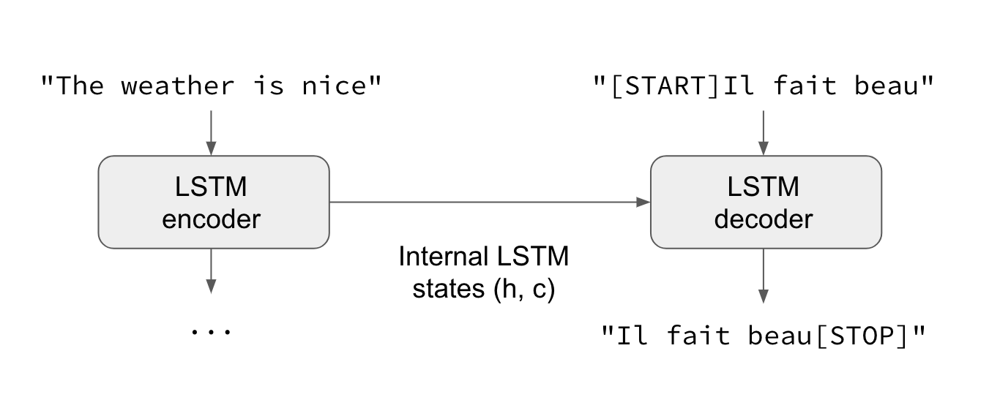

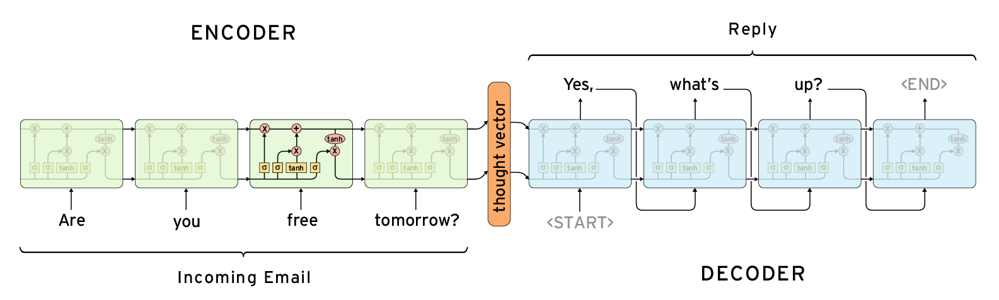

## Keywords

*   Encoder-Decoder recurrent architecture
*   Teacher forcing (training) - Prediction propagation (inference)
*   Word Embedding
    * Two learning strategies:
      * Learned from zero
        * In 2 steps. First train an embedding layer (e.g., word2vec) and then use it in the current task
        * Directly in the current task jointly with the other model parameters
      * 'Transfer Learning': import pre-trained word embedding



In [16]:
# Function to create the model
def sequence2sequence(fra_vocabulary_len, eng_vocabulary_len,
                      max_fra_seq_length, max_eng_seq_length,
                      fra_embedding_size, eng_embedding_size):

    # Build Encoder-Decoder Model
    # ---------------------------

    # ENCODER
    # -------
    encoder_input = tf.keras.Input(shape=[max_fra_seq_length], name='encoder_input')
    encoder_embedding = tf.keras.layers.Embedding(fra_vocabulary_len+1,  # +1 is for padding
                                                  fra_embedding_size,
                                                  input_length=max_fra_seq_length,
                                                  mask_zero=True, name='encoder_embedding')(encoder_input)
    encoder_output, h, c = tf.keras.layers.LSTM(units=256, return_state=True, name='encoder_lstm')(encoder_embedding)

    # Save encoder state (to initialize the decoder)
    encoder_state = [h, c]

    # DECODER
    # -------
    decoder_input = tf.keras.Input(shape=[max_eng_seq_length-1], name='decoder_input')  # -1 is for the missing EOS
    decoder_embedding = tf.keras.layers.Embedding(eng_vocabulary_len+1, # +1 is for padding
                                                  eng_embedding_size,
                                                  input_length=max_eng_seq_length-1,
                                                  mask_zero=True, name='decoder_embedding')(decoder_input)
    # Initialize decoder state with final encoder state (initial_state=encoder_state)
    decoder_lstm, _, _ = tf.keras.layers.LSTM(units=256, return_sequences=True, return_state=True, name='decoder_lstm')(decoder_embedding,
                                                                                                                        initial_state=encoder_state)

    decoder_out = tf.keras.layers.Dense(eng_vocabulary_len+1, activation='softmax', name='decoder_out')(decoder_lstm)

    # MODEL
    model = tf.keras.Model([encoder_input, decoder_input], decoder_out)

    # ----------
    # Compile training model
    model.compile(loss=tfk.losses.SparseCategoricalCrossentropy(),
                  optimizer=tfk.optimizers.Adam(learning_rate=1e-2), metrics=['accuracy'])

    return model, encoder_state

In [17]:
seq2seq_model, encoder_state = sequence2sequence(train_dataset.num_fra_words, train_dataset.num_eng_words,
                                                 train_dataset.max_fra_seq_length, train_dataset.max_eng_seq_length,
                                                 fra_embedding_size=256, eng_embedding_size=256)

seq2seq_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 encoder_input (InputLayer)     [(None, 63)]         0           []                               
                                                                                                  
 decoder_input (InputLayer)     [(None, 56)]         0           []                               
                                                                                                  
 encoder_embedding (Embedding)  (None, 63, 256)      8971264     ['encoder_input[0][0]']          
                                                                                                  
 decoder_embedding (Embedding)  (None, 56, 256)      4258304     ['decoder_input[0][0]']          
                                                                                              

In [18]:
history = seq2seq_model.fit(
    train_dataset,
    validation_data=valid_dataset,
    epochs=100,
    callbacks=[tfk.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)]
).history

Epoch 1/100
403/403 [==============================] - 525s 1s/step - loss: 0.5756 - accuracy: 0.3042 - val_loss: 0.3914 - val_accuracy: 0.4581
Epoch 2/100
403/403 [==============================] - 487s 1s/step - loss: 0.3111 - accuracy: 0.5418 - val_loss: 0.2677 - val_accuracy: 0.5958
Epoch 3/100
403/403 [==============================] - 486s 1s/step - loss: 0.2149 - accuracy: 0.6474 - val_loss: 0.2267 - val_accuracy: 0.6468
Epoch 4/100
403/403 [==============================] - 476s 1s/step - loss: 0.1675 - accuracy: 0.7021 - val_loss: 0.2110 - val_accuracy: 0.6682
Epoch 5/100
403/403 [==============================] - 484s 1s/step - loss: 0.1395 - accuracy: 0.7387 - val_loss: 0.2051 - val_accuracy: 0.6813
Epoch 6/100
403/403 [==============================] - 479s 1s/step - loss: 0.1215 - accuracy: 0.7646 - val_loss: 0.2025 - val_accuracy: 0.6894
Epoch 7/100
403/403 [==============================] - 475s 1s/step - loss: 0.1095 - accuracy: 0.7827 - val_loss: 0.2034 - val_accuracy:

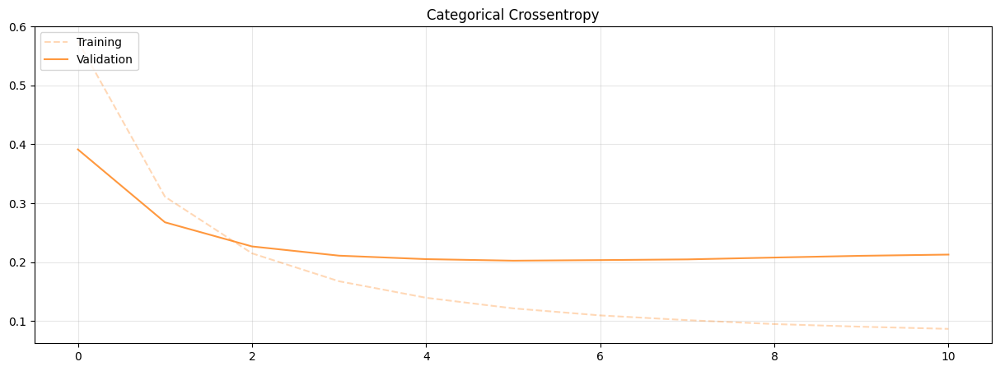

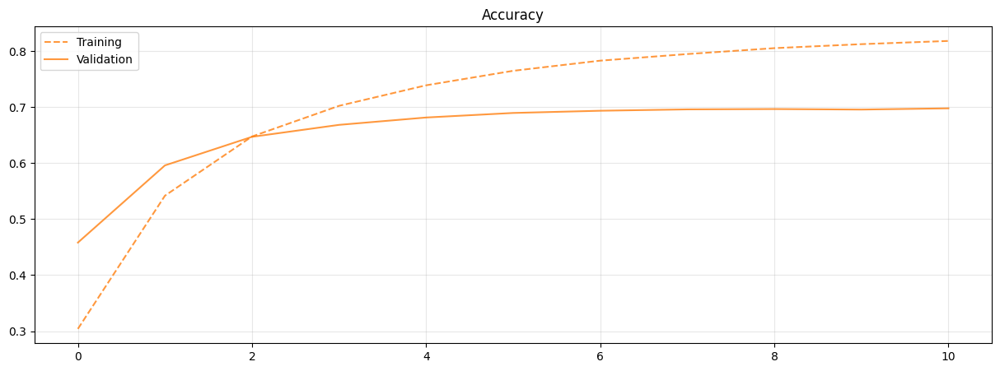

In [19]:
# Plot the training
plt.figure(figsize=(15,5))
plt.plot(history['loss'], label='Training', alpha=.3, color='#ff7f0e', linestyle='--')
plt.plot(history['val_loss'], label='Validation', alpha=.8, color='#ff7f0e')
plt.legend(loc='upper left')
plt.title('Categorical Crossentropy')
plt.grid(alpha=.3)

plt.figure(figsize=(15,5))
plt.plot(history['accuracy'], label='Training', alpha=.8, color='#ff7f0e', linestyle='--')
plt.plot(history['val_accuracy'], label='Validation', alpha=.8, color='#ff7f0e')
plt.legend(loc='upper left')
plt.title('Accuracy')
plt.grid(alpha=.3)

plt.show()

In [20]:
seq2seq_model.save('Seq2Seq')

INFO:tensorflow:Assets written to: Seq2Seq\assets


INFO:tensorflow:Assets written to: Seq2Seq\assets


In [21]:
seq2seq_model, encoder_state = sequence2sequence(train_dataset.num_fra_words, train_dataset.num_eng_words,
                                                 train_dataset.max_fra_seq_length, train_dataset.max_eng_seq_length,
                                                 fra_embedding_size=256, eng_embedding_size=256)
temp_model = tfk.models.load_model('Seq2Seq')

seq2seq_model.set_weights(temp_model.weights)

### Visualize learned embedding

In [22]:
# Save french embedding weights
weights = seq2seq_model.get_layer('encoder_embedding').get_weights()[0]

out_v = io.open('metadata/fra_vectors.tsv', 'w', encoding='utf-8')
out_m = io.open('metadata/fra_metadata.tsv', 'w', encoding='utf-8')

for idx, word in enumerate(fra_tokenizer.word_index.keys()):
  vec = weights[idx+1]
  out_v.write('\t'.join([str(x) for x in vec]) + "\n")
  out_m.write(word + "\n")
out_v.close()
out_m.close()

# Save french embedding weights
weights = seq2seq_model.get_layer('decoder_embedding').get_weights()[0]

out_v = io.open('metadata/eng_vectors.tsv', 'w', encoding='utf-8')
out_m = io.open('metadata/eng_metadata.tsv', 'w', encoding='utf-8')

for idx, word in enumerate(eng_tokenizer.word_index.keys()):
  vec = weights[idx+1]
  out_v.write('\t'.join([str(x) for x in vec]) + "\n")
  out_m.write(word + "\n")
out_v.close()
out_m.close()

In [23]:
# Download 'tsv' files (e.g., fra embedding)
try:
  from google.colab import files
  files.download('metadata/fra_vectors.tsv')
  files.download('metadata/fra_metadata.tsv')
except Exception:
  pass

Load the embedding on https://projector.tensorflow.org/

# Real time translation

In [24]:
# Modify the model such that at each translation step the decoder takes previous prediction as current input (no teacher forcing)

# ENCODER (remains the same)
# -------
input_layers = []

encoder_inference_model = tf.keras.Model(seq2seq_model.get_layer('encoder_input').input, encoder_state)

# DECODER (modified)
# ------------------

# Define new input layers that will contain the intermediate state between decoding steps
decoder_state_input_h = tf.keras.Input(shape=[256])
decoder_state_input_c = tf.keras.Input(shape=[256])
decoder_state_input = [decoder_state_input_h, decoder_state_input_c]

# Define decoder input with seq_len = 1, since it is the single word predicted at step t-1
decoder_input_single = tf.keras.Input(shape=[1])
decoder_embedding = seq2seq_model.get_layer('decoder_embedding')(decoder_input_single)
lstm_out, h, c = seq2seq_model.get_layer('decoder_lstm')(decoder_embedding, initial_state=decoder_state_input)

# Save decoder state (for next ste inference)
decoder_state = [h, c]
decoder_out = seq2seq_model.get_layer('decoder_out')(lstm_out)

decoder_inference_model = tf.keras.Model([decoder_input_single] + decoder_state_input,
                                         [decoder_out] + decoder_state)

In [25]:
# Translation utils
fra_itow = {v:k for k, v in fra_tokenizer.word_index.items()}
eng_itow = {v:k for k, v in eng_tokenizer.word_index.items()}

def translate(input_sentence):

    # Prepare input sentence
    input_tokenized = fra_tokenizer.texts_to_sequences([input_sentence])
    input_tokenized = pad_sequences(input_tokenized, maxlen=train_dataset.max_fra_seq_length)

    # Run the encoder and get the output encoder state
    states_value = encoder_inference_model.predict(input_tokenized, verbose=False)

    # Set first input to 'sos' (since we start a new translation)
    curr_input = np.zeros([1, 1])  # bs x seq_length (1 x 1 at the beginning)
    curr_input[0, 0] = eng_tokenizer.word_index['sos']
    eos = eng_tokenizer.word_index['eos']

    # This list will contain the final translated sequence
    output_sentence = []

    # Cycle until max_eng_seq_length or until the 'eos' is predicted
    for _ in range(train_dataset.max_eng_seq_length):

        # Run the decoder by giving as input the previous predicted word + previous lstm state
        # (at the beginning the state are initialized with encoder state)
        preds, h_, c_ = decoder_inference_model.predict([curr_input] + states_value, verbose=False)

        # Get index of predicted word in the dictionary through argmax
        word_id = np.argmax(preds[0, 0, :])

        # If eos end
        if eos == word_id:
            break

        word = ''

        # Convert predicted index to word and save
        if word_id > 0:
            word = eng_itow[word_id]
            output_sentence.append(word)

        # Update input and lstm state for next iteration
        curr_input[0, 0] = word_id
        states_value = [h_, c_]

    return ' '.join(output_sentence)

In [26]:
print(translate("Ceci est une phrase"))

this is a sentence


In [44]:
sentence = input("entrez une phrase: ")
print(sentence)
print("translation: ", translate(sentence))

J'aime apprendre
translation:  i like to learn


In [38]:
def translate_song(fr_lyrics_file, en_lyrics_file):
    
    fr_song = open(fr_lyrics_file, encoding='utf-8')
    en_song = open(en_lyrics_file, "w")

    for sentence in fr_song :
        translation = translate(sentence)
        print(sentence, " | ", translation)
        en_song.write(translation + "\n")

    fr_song.close()
    en_song.close()

    return

In [39]:
translate_song("inputs/paroles.txt", "outputs/lyrics.txt")


C'est la belle nuit de Noël
  |  this is our christmas night
La neige étend son manteau blanc
  |  snow is white
Et les yeux tournés vers le ciel
  |  the eyes and squeezed the sky
À genoux, les petits enfants
  |  at the edge of your children were going
Avant de fermer les paupières
  |  before watching the gate
Font une dernière prière
  |  one of the latest fox
Petit Papa Noël
  |  little christmas eve
Quand tu descendras du ciel
  |  when are you wearing a band
Avec des jouets par milliers
  |  i live with bankruptcy
N'oublie pas mon petit soulier
  |  don't forget my little use
Mais avant de partir
  |  before we go
Il faudra bien te couvrir
  |  he'll have to look up it well
Dehors tu vas avoir si froid
  |  you'll get cold if you don't feel
C'est un peu à cause de moi
  |  it's a little of me
Il me tarde tant que le jour se lève
  |  he gets up as a shower so i often showed up
Pour voir si tu m'as apporté
  |  to see you so much for me
Tous les beaux joujoux que je vois en rêve


In [45]:
translate_song("inputs/enfants_du_monde.txt", "outputs/children_of_the_world.txt")

Enfants de Palestine
  |  children are making me
Ou enfants d'Israël
  |  fill it
D'Amérique ou de Chine
  |  america or china
En ce jour de Noël
  |  christmas day in this
Que ton regard se pose
  |  what does your suggestion
Sur la terre ou le ciel
  |  on earth will lead the gun
Ne retiens qu'une chose
  |  just don't have any help
Il faut croire à noël
  |  we need to eat

  |  let's get it
Matin couleur de cendre
  |  this morning is slow
Ou matin d'arc en ciel
  |  contact the morning will you
Qu'importe il faut attendre
  |  no matter how to wait
En ce soir de Noël
  |  christmas evening
Que les fusils se taisent
  |  what are the guns
Et répondent à l'appel
  |  no one for the past
De cette parenthèse
  |  this is
Qui s'appelle Noël
  |  who's christmas

  |  let's get it
Un jour viendra peut-être
  |  a day may come
Un jour au gout de miel
  |  a day of the honey on rainy hours
Où l'on verra paraitre
  |  where are we going

  |  let's get it
Un oiseau dans le ciel
  |  a bird